# Group: GroundZero


## Team Members: Duggal Vidurveer, Kharbanda Pranshu, Damani Mehul, Vencent Yeo Shyn Yaw

## Data Set: Aircraft Accidents and Incidents
### https://www.kaggle.com/khsamaha/aviation-accident-database-synopses

Our code is in the following order:-

1) Countplots and Catplots for various individual parameters:
    - Months and Years (Separately)
    - Months and Years (Combined)
        - Includes correlation and heatmap for accidents in relation to Months and Years
    - Broad Phase of Flight
    - Manufacturers
        - Includes Incidents for Manufacturer's aircrafts (Cessna and Piper)
        - Cessna and Piper top model aircraft accidents
        - Input Aircraft Manufacturers to get respective crashes over the years
    - Purpose of Flight
        - Sample Plots for Cessna in Commercial and Personal/Instructional purpose
        - Input aircraft manufacturer to get respective correlation for required purpose
    - Weather Conditions
    
2) Plot of Aircraft Incidents on the World Map color-coded according to Aircraft Damage (Minor, Substantial, Destroyed)

3) Predicition of total accidents in an input year and their distribution based of Aircraft Makes

4) Predictions based on parameter inputs - Using Random Forest Classifier

In [1]:
#Importing basic libraries

import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

In [2]:
#Reading CSV file and ensuring correct encoding

aviation_data = pd.read_csv("AviationData.csv", encoding="latin1")
aviation_data.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date
0,20200102X82407,Accident,WPR20CA055,31/12/2019,"Elk, CA",United States,39.128611,-123.715833,LLR,Little River,...,Personal,NaN,NaN,NaN,NaN,1.0,VMC,TAKEOFF,Factual,13/1/2020
1,20191231X83852,Accident,CEN20FA049,31/12/2019,"OLATHE, KS",United States,38.846111,-94.736111,OJC,Johnson County Executive,...,Personal,NaN,2.0,NaN,NaN,NaN,VMC,TAKEOFF,Preliminary,8/1/2020
2,20200102X54844,Accident,ANC20CA011,31/12/2019,"Fairbanks, AK",United States,64.666945,-148.133334,NaN,NaN,...,Personal,NaN,NaN,NaN,NaN,2.0,NaN,NaN,Preliminary,2/1/2020
3,20191230X91852,Accident,CEN20CA048,30/12/2019,"GRANBURY, TX",United States,32.365556,-97.645000,NaN,NaN,...,Personal,NaN,NaN,NaN,NaN,1.0,NaN,NaN,Preliminary,31/12/2019
4,20191228X62945,NaN,WPR20CA053,28/12/2019,"Missoula, MT",United States,NaN,NaN,MSO,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Preliminary,3/1/2020


# Checking DataFrame entities

In [3]:
#Checking vital stats

print("Data type : ", type(aviation_data))
print("Data dims : ", aviation_data.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (84262, 31)


In [4]:
#Checking Variable Data types

print (aviation_data.dtypes)

Event.Id                   object
Investigation.Type         object
Accident.Number            object
Event.Date                 object
Location                   object
Country                    object
Latitude                  float64
Longitude                 float64
Airport.Code               object
Airport.Name               object
Injury.Severity            object
Aircraft.Damage            object
Aircraft.Category          object
Registration.Number        object
Make                       object
Model                      object
Amateur.Built              object
Number.of.Engines         float64
Engine.Type                object
FAR.Description            object
Schedule                   object
Purpose.of.Flight          object
Air.Carrier                object
Total.Fatal.Injuries      float64
Total.Serious.Injuries    float64
Total.Minor.Injuries      float64
Total.Uninjured           float64
Weather.Condition          object
Broad.Phase.of.Flight      object
Report.Status 

# 1) COUNTPLOTS AND CATPLOTS

# Plotting Accidents by Month and Year (Separately)

In [5]:
#Extracting Date of Incidents and removing accidents before 1982

event_time = pd.to_datetime(aviation_data["Event.Date"], dayfirst=True)
years = event_time.dt.year
months = event_time.dt.month
for count in range(len(years)):
    if years[count]<1982:
        years=years.drop(count)
        months=months.drop(count)
        aviation_data=aviation_data.drop(count)

In [6]:
#Making DataFrame of Accidents per Year

count_per_year=[]
year=[]
for x in years.index:
    check=0
    for y in range(len(year)):
        if years[x]==year[y]:
            count_per_year[y]+=1
            check=1
            break
    if check==0:
            year.append(years[x])
            count_per_year.append(1)
            
data_year=[]
for x in range(len(year)):
    data_year.append([year[x], count_per_year[x]])
accidents_per_year = pd.DataFrame(data_year, columns=["Year","Accidents per Year"])
max_year = max(count_per_year)
accidents_per_year.head()

,Year,Accidents per Year
0,2019,1479
1,2018,1622
2,2017,1601
3,2016,1631
4,2015,1600


In [7]:
#Making DataFrame of Accidents per Month

#Giving the Months names rather than numbers for ease of understanding

Months_arr = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
months_names=months.astype(str)
for x in range(len(months_names)):
    months_names.at[x] = Months_arr[months[x]-1]

count_per_month=[]
month=[]
month_num=[]
for x in months_names.index:
    check=0
    for y in range(len(month)):
        if months_names[x]==month[y]:
            count_per_month[y]+=1
            check=1
            break
    if check==0:
            month.append(months_names[x])
            count_per_month.append(1)
            month_num.append(months[x])
            
data_month=[]
for x in range(len(month)):
    data_month.append([month_num[x], month[x], count_per_month[x]])
accidents_per_month = pd.DataFrame(data_month, columns=["No.", "Month","Accidents per Month"])
accidents_per_month = accidents_per_month.sort_values(by="No.", ascending=True)
accidents_per_month = accidents_per_month.set_index("No.")
accidents_per_month.head()

,Month,Accidents per Month
No.,,
1,January,4717
2,February,4969
3,March,6346
4,April,6911
5,May,8125


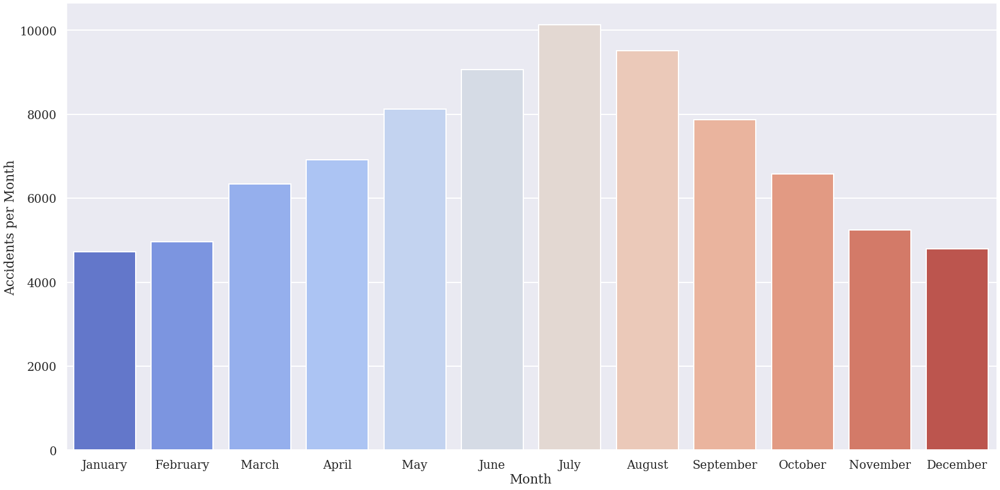

In [8]:
#Plotting the total number of accidents by Month

sb.set(context = "poster", style="darkgrid", font = "serif", font_scale = 0.9)
Month_Plot=sb.catplot(x = "Month", y = "Accidents per Month", kind = "bar", data = accidents_per_month, palette = "coolwarm", height = 12, aspect = 2)

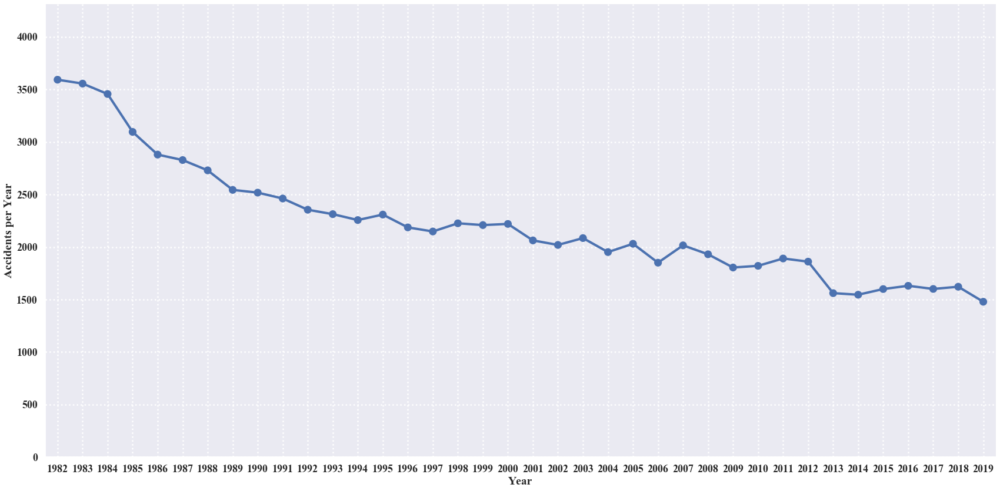

In [9]:
#Plotting the total number of accidents by Year (Including and after 1982)

sb.set(context='talk', style='darkgrid', font = "Times New Roman", font_scale =1.09)
year_plt = sb.catplot(x="Year", y="Accidents per Year", data=accidents_per_year, height = 12, aspect = 2, kind = "point")
year_plt.set(ylim=(0, max_year*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

# Merging Year and Month Plots

In [10]:
#Making DataFrame of Accidents per Month of a Particular Year

count_per_month=[]
month=[]
range_min=0
range_max=0
for x in accidents_per_year.index:
    month_year=[]
    month_year_count=[]
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    for y in range(range_min, range_max):
        check=0
        for z in range(len(month_year)):
            if months[y]==month_year[z]:
                month_year_count[z]+=1
                check=1
                break
        if check==0:
            month_year.append(months[y])
            month_year_count.append(1)
    range_min=range_max
    count_per_month.append(month_year_count)
    month.append(month_year)
data_month=[]
for x in range(len(count_per_month)):
    for y in range(len(month[x])):
        data_month.append([month[x][y], Months_arr[11-y], count_per_month[x][y], year[x]])
df_month = pd.DataFrame(data_month, columns = ['Months', 'Month', 'Number of Accidents', 'Year'])
sb.set(context = "poster", style="dark", font = "serif", font_scale = 0.5)

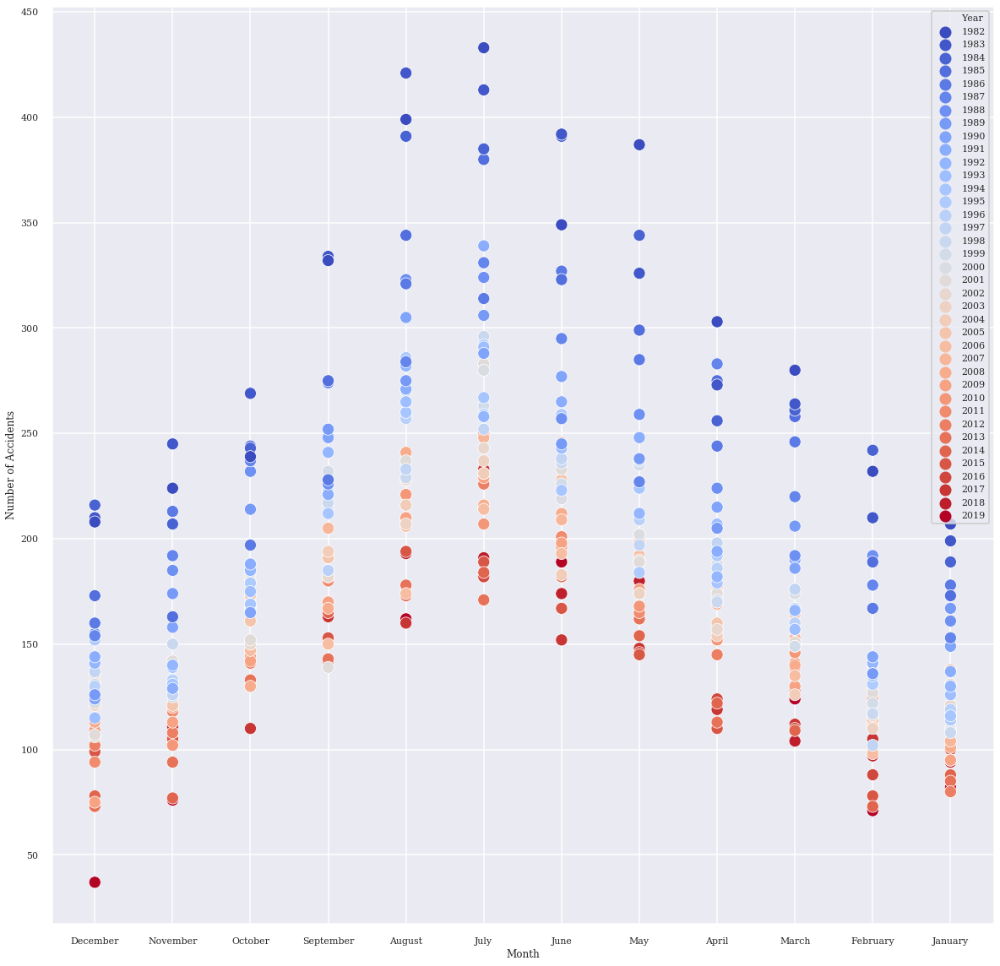

In [11]:
#Plotting DataFrame as a scatterplot

f, axes = plt.subplots(1,1, figsize = (20,20))
sb.scatterplot(x="Month", y="Number of Accidents", data=df_month, hue = "Year", s=200, palette = "coolwarm", legend = "full", marker = "o")
plt.grid(True,which="both",ls="-",c='white',lw = 1.5)  

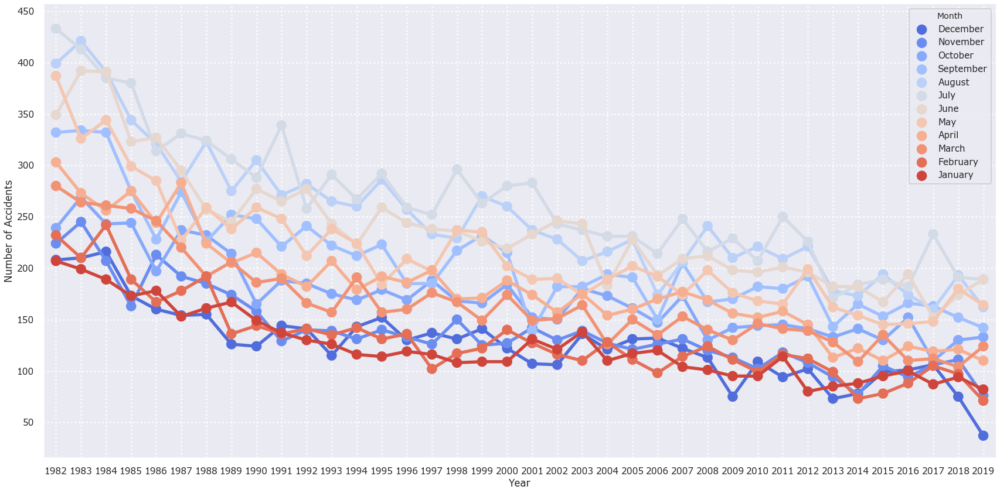

In [12]:
#Plotting DataFrame as a catplot, to show the decrease for each month (color-coded)

sb.set(context='poster', style='dark', font = "Verdana", font_scale =0.7)
sb.catplot("Year", "Number of Accidents", "Month",
                   data=df_month, kind = "point",
                   height=12, palette="coolwarm",
                   legend=True, aspect = 2, legend_out = False)
plt.grid(True,which="both",ls=":",c='white',lw = 2.5)  

## Correlation and Heatmaps

In [13]:
joint_month = pd.concat([df_month["Months"], df_month["Number of Accidents"]], axis = 1)
joint_month.reindex(df_month.index)
joint_month.corr()

,Months,Number of Accidents
Months,1.000000,0.069495
Number of Accidents,0.069495,1.000000


In [14]:
joint_year = pd.concat([accidents_per_year["Year"], accidents_per_year["Accidents per Year"]], axis = 1)
joint_month.reindex(accidents_per_year.index)
joint_year.corr()

,Year,Accidents per Year
Year,1.000000,-0.930396
Accidents per Year,-0.930396,1.000000


(0, 2)

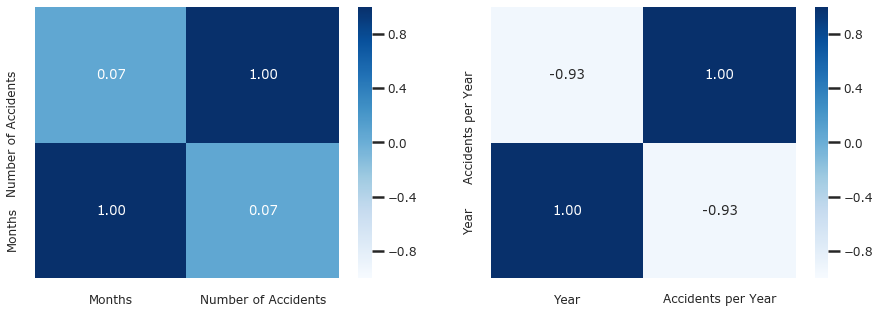

In [15]:
sb.set(context='poster', style='dark', font = "Verdana", font_scale =0.55)
f, axes = plt.subplots(1,2, figsize = (15,5))

month_heatmap = sb.heatmap(joint_month.corr(), vmin = -1, vmax = 1, annot = True, fmt='.2f', cmap="Blues", ax = axes[0])
month_heatmap.set_ylim([0,2])

year_heatmap = sb.heatmap(joint_year.corr(), vmin = -1, vmax = 1, annot = True, fmt='.2f', cmap="Blues", ax = axes[1])
year_heatmap.set_ylim([0,2])

The linear regression of the accidents per month in a year are loosely correlated, with a correlation of only 0.07, while for the number of accidents per year, there is a very strong negative correlation at -0.93.

# Plotting Accidents by Broad Phase of Flight

In [16]:
#Extracting Data and replacing missing values

phase_of_flight = pd.DataFrame(aviation_data["Broad.Phase.of.Flight"])
phase_of_flight = phase_of_flight.replace(np.nan, "UNKNOWN")    #Replacing Null Values by UNKNOWN rather than removing it.

#Creating DataFrame with count of accidents at different phases of flight to allow for plotting

phase_of_flight_count = phase_of_flight["Broad.Phase.of.Flight"].value_counts()

print(phase_of_flight_count)

LANDING        20625
TAKEOFF        16272
CRUISE         11131
MANEUVERING    10367
APPROACH        8162
UNKNOWN         7399
TAXI            2471
CLIMB           2360
DESCENT         2305
GO-AROUND       1696
STANDING        1299
OTHER            168
Name: Broad.Phase.of.Flight, dtype: int64


[Text(0, 0.5, 'Number of Accidents'), Text(0.5, 0, 'Broad Phase of Flight')]

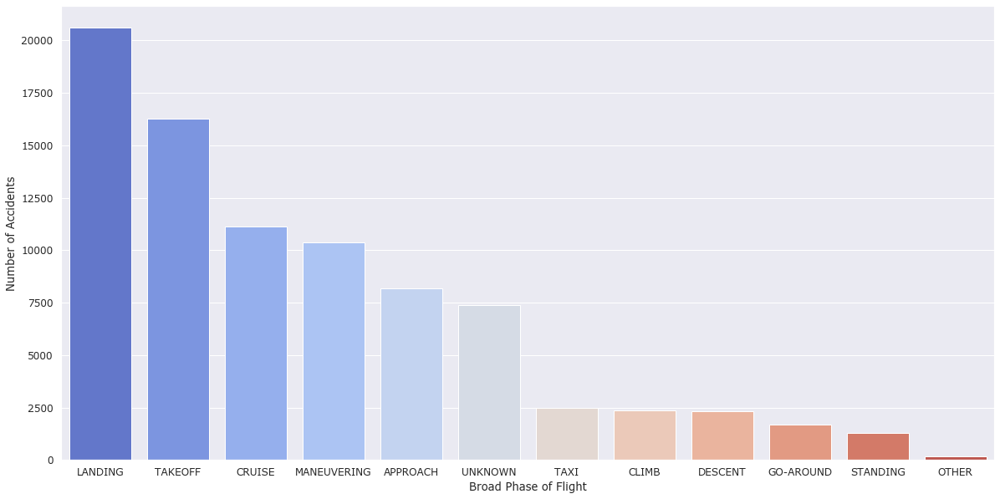

In [17]:
#Plotting accidents on countplot based on Phase of Flight

sb.set(style="darkgrid", font = "Verdana", font_scale = 1.1)
f,axes = plt.subplots(1,1,figsize = (20,10))
Phase_plot = sb.countplot(phase_of_flight["Broad.Phase.of.Flight"], order=phase_of_flight_count.index, palette = "coolwarm")
Phase_plot.set(xlabel = "Broad Phase of Flight", ylabel = "Number of Accidents")

# Plotting Accidents by Manufacturer

In [18]:
#Clean and verifying make columns to make sure there are no duplicates

manufacturer = pd.DataFrame(aviation_data, columns = ["Make"])

manufacturer["Make"] = manufacturer['Make'].str.title()
#Verify that there are no duplicates
manufacturer_counts = pd.DataFrame(manufacturer['Make'].value_counts())
manufacturer_counts.head(10)

,Make
Cessna,26070
Piper,14229
Beech,5148
Bell,2598
Boeing,2349
Mooney,1272
Grumman,1152
Robinson,1124
Bellanca,1020
Hughes,913


[Text(0, 0.5, 'Number of Accidents'), Text(0.5, 0, 'Manufacturer')]

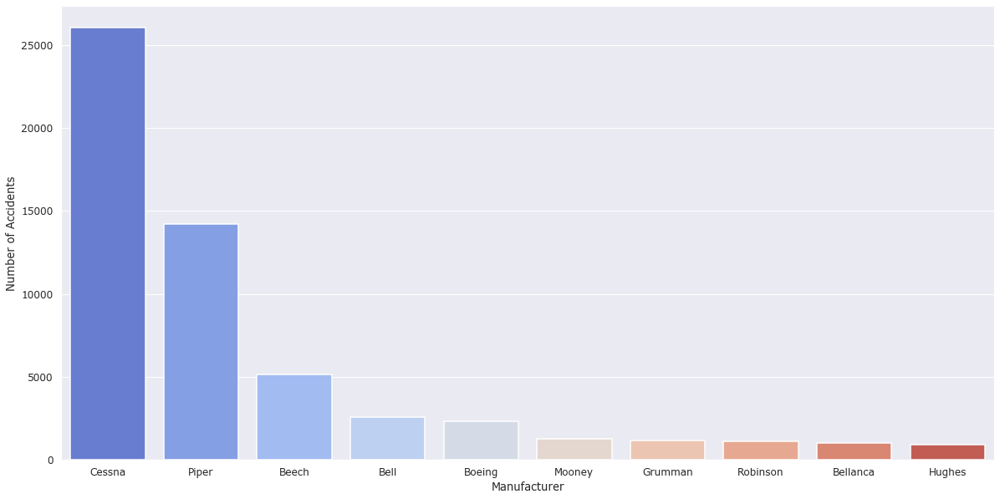

In [19]:
#Plotting the Top 10 Manufacturers (by accident numbers)

df_maker_test = pd.DataFrame(manufacturer_counts.head(10))  #Dataframe of top 10
f,axes = plt.subplots(1,1,figsize = (20,10))
sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =0.9)
Maker_plot = sb.countplot(manufacturer["Make"], order=df_maker_test.index, palette = "coolwarm")
Maker_plot.set(xlabel = "Manufacturer", ylabel = "Number of Accidents")

## Sample Manufacturer Trend - Cessna

In [20]:
#Finding the Number of Cessna accidents per year (1982-2019)

cessna_year=[]
cessna_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    cessna_count=0
    for y in range(range_min, range_max):
        try:
            if manufacturer["Make"][y]=="Cessna":
                cessna_count+=1
        except Exception:
            pass
    range_min=range_max
    cessna_year.append(accidents_per_year["Year"][x])
    cessna_count_arr.append(cessna_count)

data_cessna=[]
for x in range(len(cessna_count_arr)):
    data_cessna.append([cessna_year[x], cessna_count_arr[x]])
df_cessna = pd.DataFrame(data_cessna, columns = ['Year', 'Cessna Accidents'])
max_cessna = max(cessna_count_arr)

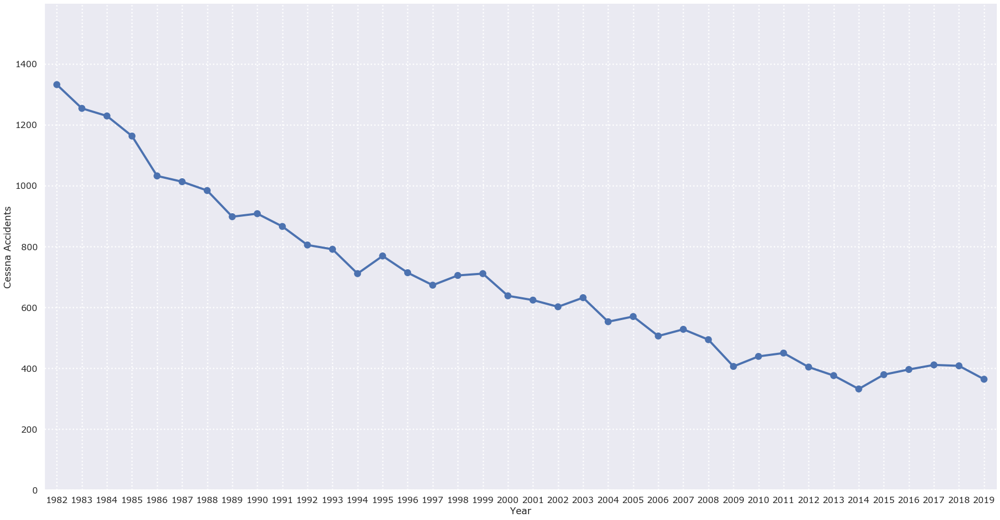

In [21]:
#Plotting the Accidents per year on a catplot to see trendline

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1)
cessna_plt = sb.catplot(x="Year", y="Cessna Accidents", data=df_cessna, height = 14, aspect = 1.9, kind  = "point")
cessna_plt.set(ylim=(0, max_cessna+(max_cessna*0.2)))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

## Top Cessna Models involved in Accidents

[Text(0, 0.5, 'Number of Accidents'), Text(0.5, 0, 'Cessna Model')]

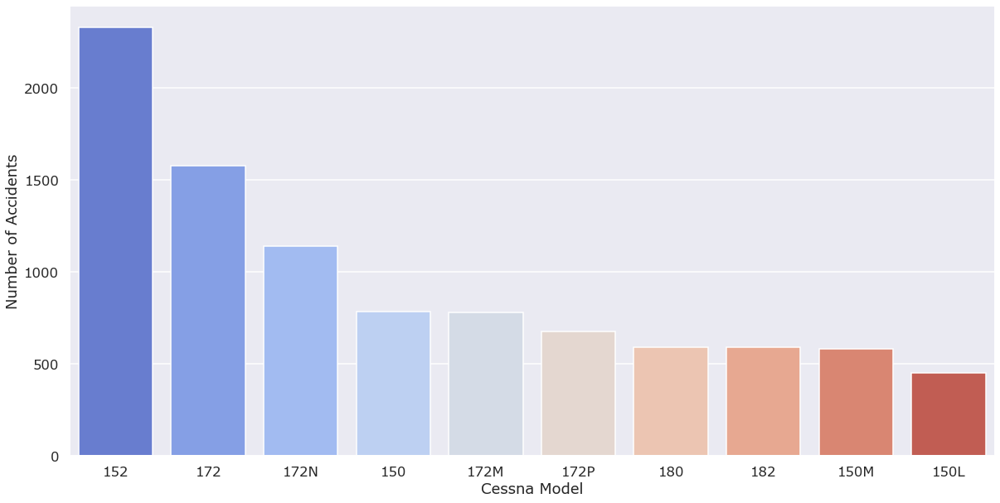

In [22]:
#Calculating the top Cessna models involved in aviation incidents

manufacturer_cessna = pd.DataFrame(aviation_data, columns = ["Make", "Model"])
manufacturer_cessna["Make"] = manufacturer_cessna["Make"].str.title()
manufacturer_cessna["Model"] = manufacturer_cessna["Model"].str.title()

for x in manufacturer_cessna.index:
    if manufacturer_cessna["Make"][x] != "Cessna":
        manufacturer_cessna = manufacturer_cessna.drop(x)
manufacturer_count_cessna = pd.DataFrame(manufacturer_cessna["Model"].value_counts())
cessna_10 = pd.DataFrame(manufacturer_count_cessna.head(10))

f,axes = plt.subplots(1,1,figsize = (20,10))
sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =0.9)

cessna_model_plot = sb.countplot(manufacturer_cessna["Model"], order=cessna_10.index, palette = "coolwarm")
cessna_model_plot.set(xlabel = "Cessna Model", ylabel = "Number of Accidents")

## Sample Manufacturer Trend - Piper

In [23]:
#Finding number of Piper Accidents per Year (1982-2019)

piper_year=[]
piper_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    piper_count=0
    for y in range(range_min, range_max):
        try:
            if manufacturer["Make"][y]=="Piper":
                piper_count+=1
        except Exception:
            pass
    range_min=range_max
    piper_year.append(accidents_per_year["Year"][x])
    piper_count_arr.append(piper_count)

data_piper=[]
for x in range(len(piper_count_arr)):
    data_piper.append([piper_year[x], piper_count_arr[x]])
df_piper = pd.DataFrame(data_piper, columns = ['Year', 'Piper Accidents'])
max_piper = max(piper_count_arr)

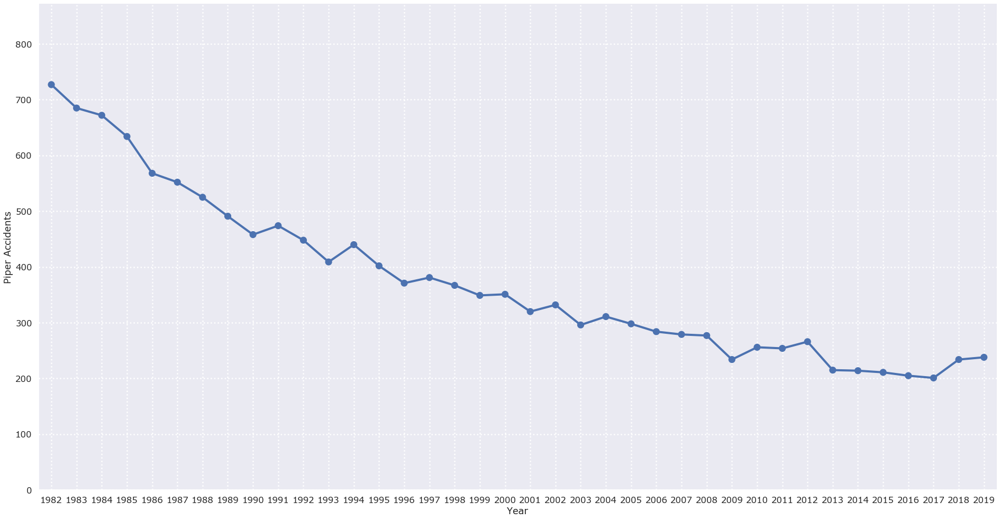

In [24]:
#Plotting Piper Accidents per Year

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1)
piper_plt = sb.catplot(x="Year", y="Piper Accidents", data=df_piper, height = 14, aspect = 1.9, kind = "point")
piper_plt.set(ylim=(0, max_piper*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

## Top Piper Models Involved in Accidents

[Text(0, 0.5, 'Number of Accidents'), Text(0.5, 0, 'Piper Model')]

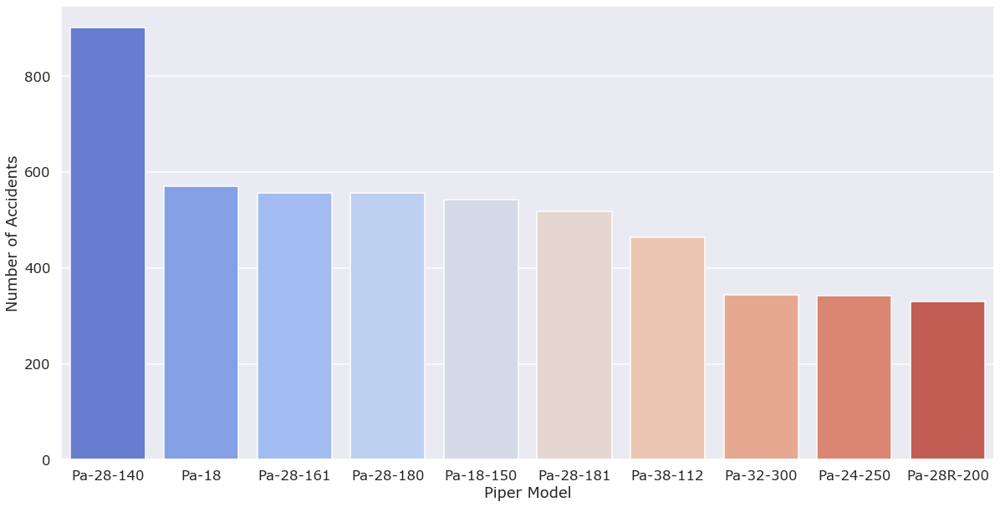

In [25]:
#Calculating and determining the top Piper models (from DataFrame) involved in aviation incidents

manufacturer_piper = pd.DataFrame(aviation_data, columns = ["Make", "Model"])
manufacturer_piper["Make"] = manufacturer_piper["Make"].str.title()
manufacturer_piper["Model"] = manufacturer_piper["Model"].str.title()

for x in manufacturer_piper.index:
    if manufacturer_piper["Make"][x] != "Piper":
        manufacturer_piper = manufacturer_piper.drop(x)
manufacturer_count_piper = pd.DataFrame(manufacturer_piper["Model"].value_counts())
piper_10 = pd.DataFrame(manufacturer_count_piper.head(10))

f,axes = plt.subplots(1,1,figsize = (20,10))
sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =0.9)

piper_model_plot = sb.countplot(manufacturer_piper["Model"], order=piper_10.index, palette = "coolwarm")
piper_model_plot.set(xlabel = "Piper Model", ylabel = "Number of Accidents")

## Correlations and Heatmaps (Cessna and Piper)

In [26]:
#Correlation of accidents over the years (Cessna)

joint_cessna = pd.concat([df_cessna["Year"], df_cessna["Cessna Accidents"]], axis = 1)
joint_cessna.reindex(df_cessna.index)
joint_cessna.corr()

,Year,Cessna Accidents
Year,1.000000,-0.957982
Cessna Accidents,-0.957982,1.000000


In [27]:
#Correlation of accidents over the years (Piper)

joint_piper = pd.concat([df_piper["Year"], df_piper["Piper Accidents"]], axis = 1)
joint_piper.reindex(df_piper.index)
joint_piper.corr()

,Year,Piper Accidents
Year,1.000000,-0.947275
Piper Accidents,-0.947275,1.000000


In [28]:
#Setting styles for heatmap

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =0.80)

(0, 2)

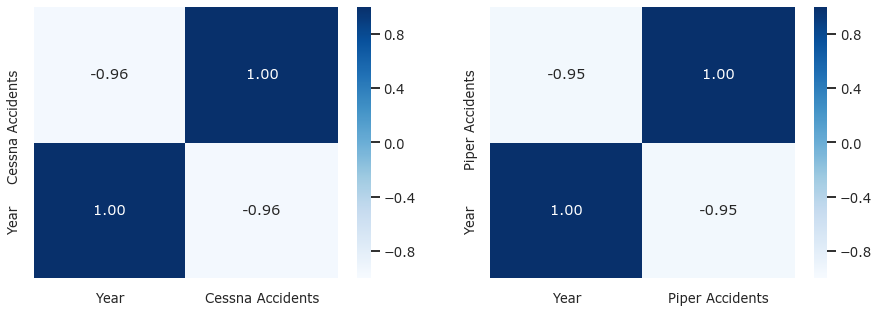

In [29]:
#Heatmaps of both Cessna and Piper accidents

f, axes = plt.subplots(1,2, figsize = (15,5))

cessna_heatmap = sb.heatmap(joint_cessna.corr(), vmin = -1, vmax = 1, annot = True, fmt='.2f', cmap="Blues", ax = axes[0])
cessna_heatmap.set_ylim([0,2])

piper_heatmap = sb.heatmap(joint_piper.corr(), vmin = -1, vmax = 1, annot = True, fmt='.2f', cmap="Blues", ax = axes[1])
piper_heatmap.set_ylim([0,2])

## Sample for Input Manufacturer (REQUIRES INPUT)

### Examples include: Airbus, Boeing, Cirrus, Bell, Hughes, Beech, Mooney, Grumman....

Input an Aircraft Manufacturer: Airbus


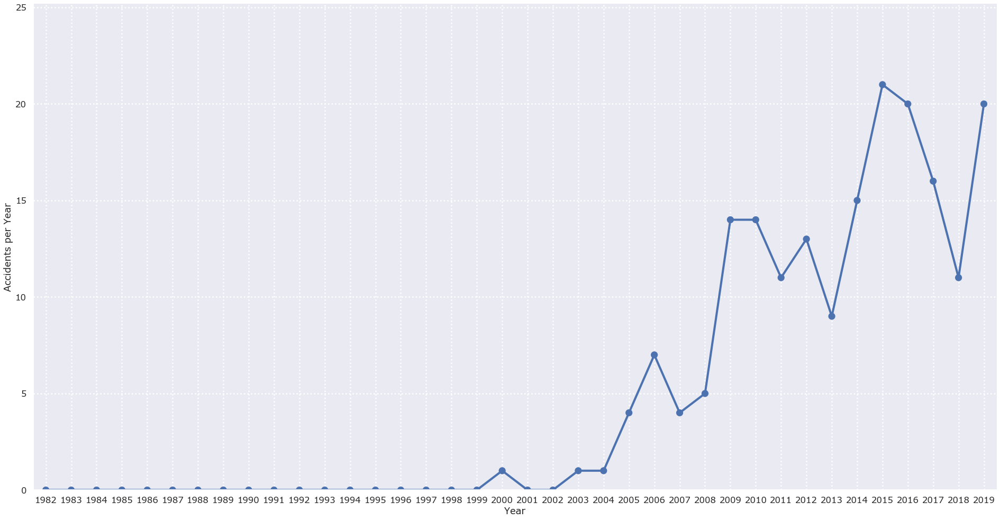

In [30]:
#Determining the Accidents over the years for User Input

input_manufac = (input("Input an Aircraft Manufacturer: ")).title()

manufac_year=[]
manufac_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    manufac_count=0
    for y in range(range_min, range_max):
        try:
            if manufacturer["Make"][y]==input_manufac:
                manufac_count+=1
        except Exception:
            pass
    range_min=range_max
    manufac_year.append(accidents_per_year["Year"][x])
    manufac_count_arr.append(manufac_count)

data_manufac=[]
for x in range(len(manufac_count_arr)):
    data_manufac.append([manufac_year[x], manufac_count_arr[x]])
df_manufac = pd.DataFrame(data_manufac, columns = ['Year', 'Accidents per Year'])
manufac_max = max(manufac_count_arr)

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1)
manufac_plt = sb.catplot(x="Year", y="Accidents per Year", data=df_manufac, height = 14, aspect = 1.9, kind = "point")
manufac_plt.set(ylim=(0, manufac_max*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

In [31]:
#Correlation of accidents over the years (User Input)

joint_input = pd.concat([df_manufac["Year"], df_manufac["Accidents per Year"]], axis = 1)
joint_input.reindex(df_manufac.index)
joint_input.corr()

,Year,Accidents per Year
Year,1.000000,0.837533
Accidents per Year,0.837533,1.000000


In [32]:
#Setting styles for heatmap

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =0.80)

(0, 2)

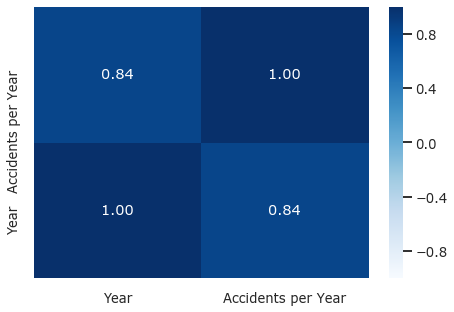

In [33]:
#Heatmap of Correlation (User Input)

f, axes = plt.subplots(1,1, figsize = (7.5,5))
input_heatmap = sb.heatmap(joint_input.corr(), vmin = -1, vmax = 1, annot = True, fmt='.2f', cmap="Blues")
input_heatmap.set_ylim([0,2])

# Plotting Accidents by Purpose of Flight

In [34]:
#Finding counts of various purpose of Flights

purpose = pd.DataFrame(aviation_data, columns = ["Purpose.of.Flight"])
purpose = purpose.replace(np.nan, "Unknown")
print(purpose["Purpose.of.Flight"].value_counts())
purpose_counts = pd.DataFrame(purpose["Purpose.of.Flight"].value_counts())

Personal                     47198
Unknown                      11667
Instructional                10101
Aerial Application            4559
Business                      3971
Positioning                   1576
Other Work Use                1172
Ferry                          804
Aerial Observation             738
Public Aircraft                712
Executive/Corporate            529
Flight Test                    367
Skydiving                      176
Air Race/Show                  169
Public Aircraft - Federal      100
External Load                  100
Banner Tow                      93
Public Aircraft - Local         70
Public Aircraft - State         64
Glider Tow                      51
Firefighting                    27
Air Drop                        11
Name: Purpose.of.Flight, dtype: int64


[Text(21.200000000000003, 0.5, 'Number of Accidents'),
 Text(0.5, 21.200000000000003, 'Purpose of Flight')]

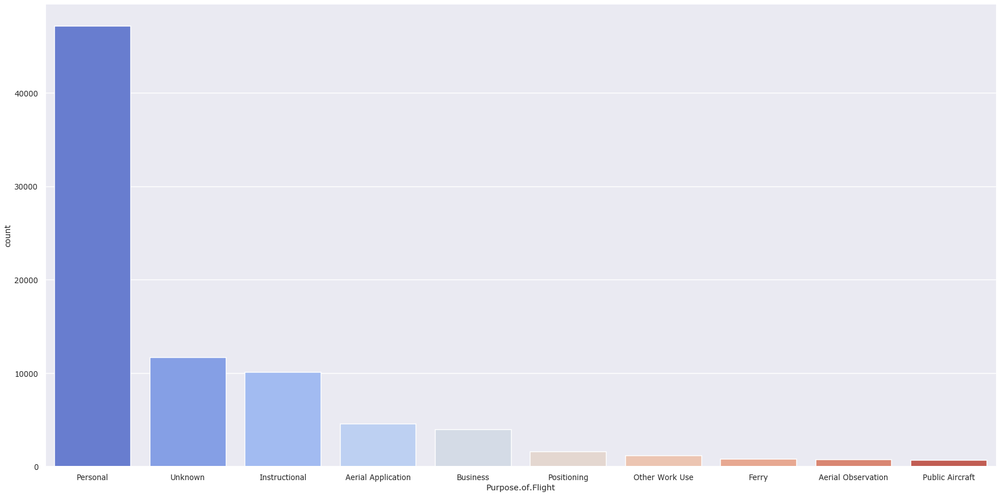

In [35]:
#Plotting the Top 10 Purpose of Flights (by accident numbers)

df_purpose = pd.DataFrame(purpose_counts.head(10))  #Dataframe of top 10
f,axes = plt.subplots(1,1,figsize = (30,15))
sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1.2)
Purpose_plot = sb.countplot(purpose["Purpose.of.Flight"], order=df_purpose.index, palette = "coolwarm")
Maker_plot.set(xlabel = "Purpose of Flight", ylabel = "Number of Accidents")

## Cessna and Total Personal/Instructional Plots

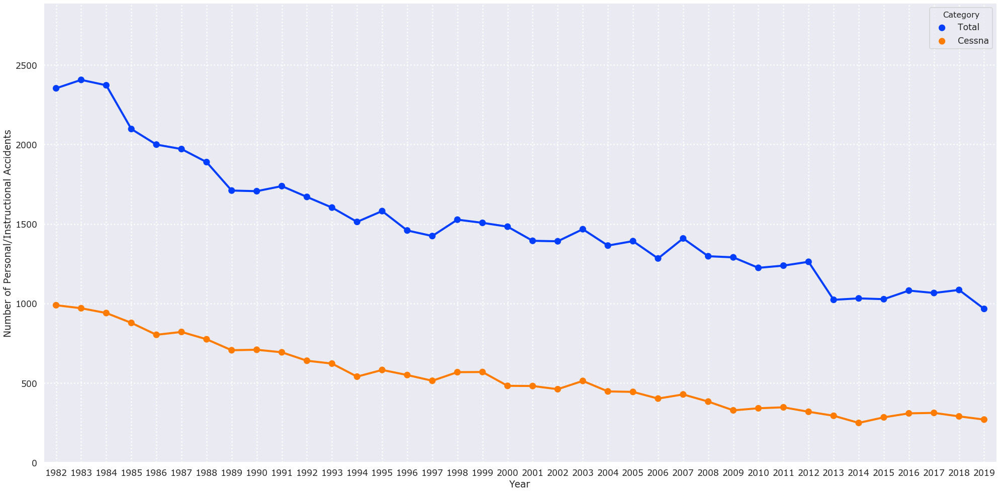

In [36]:
per_year=[]
per_count_arr=[]
cessna_per_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    per_count=0
    cessna_per_count=0
    for y in range(range_min, range_max):
        try:
            if purpose["Purpose.of.Flight"][y]=="Instructional" or purpose["Purpose.of.Flight"][y]=="Personal":
                per_count+=1
                if manufacturer["Make"][y]=="Cessna":
                    cessna_per_count+=1
        except Exception:
            pass
    range_min=range_max
    per_year.append(accidents_per_year["Year"][x])
    per_count_arr.append(per_count)
    cessna_per_count_arr.append(cessna_per_count)

label_arr = ["Total", "Cessna"]

data_per=[]
for x in range(len(per_count_arr)):
    for y in range(len(label_arr)):
        if y ==0:
            data_per.append([per_year[x], label_arr[y], per_count_arr[x]])
        else:
            data_per.append([per_year[x], label_arr[y], cessna_per_count_arr[x]])
df_per = pd.DataFrame(data_per, columns = ['Year', 'Category', 'Number of Personal/Instructional Accidents'])
max_per = max(per_count_arr)

#Plotting Commerical Accidents per Year

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1.05)
per_plt = sb.catplot("Year", "Number of Personal/Instructional Accidents", "Category", 
                   data=df_per, kind = "point",
                   height=14, palette="bright",
                   legend=True, aspect = 2, legend_out = False)
per_plt.set(ylim=(0, max_per*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

## Cessna and Total Commercial Plots 

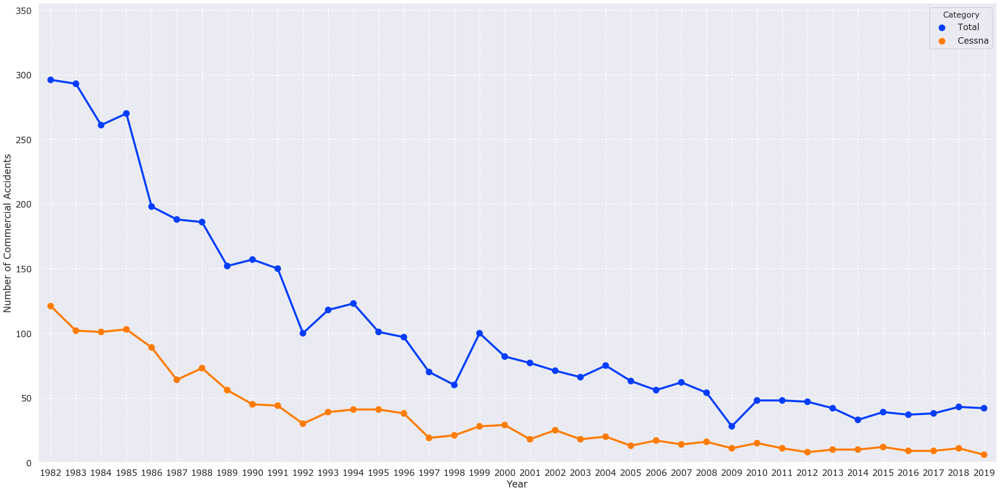

In [37]:
#Finding number of Commercial Accidents per Year (1982-2019)

comm_year=[]
comm_count_arr=[]
cessna_comm_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    comm_count=0
    cessna_comm_count=0
    for y in range(range_min, range_max):
        try:
            if purpose["Purpose.of.Flight"][y]=="Business":
                comm_count+=1
                if manufacturer["Make"][y]=="Cessna":
                    cessna_comm_count+=1
        except Exception:
            pass
    range_min=range_max
    comm_year.append(accidents_per_year["Year"][x])
    comm_count_arr.append(comm_count)
    cessna_comm_count_arr.append(cessna_comm_count)

label_arr = ["Total", "Cessna"]

data_comm=[]
for x in range(len(comm_count_arr)):
    for y in range(len(label_arr)):
        if y ==0:
            data_comm.append([comm_year[x], label_arr[y], comm_count_arr[x]])
        else:
            data_comm.append([comm_year[x], label_arr[y], cessna_comm_count_arr[x]])
df_comm = pd.DataFrame(data_comm, columns = ['Year', 'Category', 'Number of Commercial Accidents'])
max_comm = max(comm_count_arr)

#Plotting Commerical Accidents per Year

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1.05)
comm_plt = sb.catplot("Year", "Number of Commercial Accidents", "Category", 
                   data=df_comm, kind = "point",
                   height=14, palette="bright",
                   legend=True, aspect = 2, legend_out = False)
comm_plt.set(ylim=(0, max_comm*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

## Manufacturer and Purpose of Flight Plot (INPUT REQUIRED)

### Examples include Business, Personal, Instructional, Ferry, Skydiving, Flight Test, Firefighting...

#### A lot of Commercial and Business is under Unknown due to NaN values

Enter Manufacturer: Airbus
Enter Purpose of Flight: Unknown


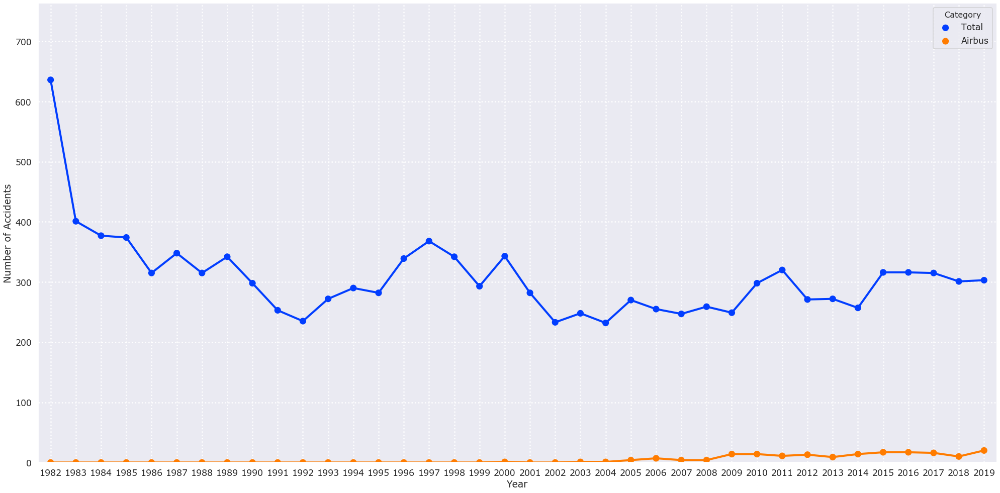

In [38]:
#Plots Graphs of Manufacturer and particular input Purpose of Flight plot on same graph

manufac_input_purpose = (input("Enter Manufacturer: ")).title()
purpose_input = (input("Enter Purpose of Flight: ")).title()

input_year=[]
input_count_arr=[]
manufac_input_count_arr=[]
range_min=0
range_max=0
total=0
for x in accidents_per_year.index:
    range_max=range_max+accidents_per_year["Accidents per Year"][x]
    input_count=0
    manufac_input_count=0
    for y in range(range_min, range_max):
        try:
            if purpose["Purpose.of.Flight"][y]==purpose_input:
                input_count+=1
                if manufacturer["Make"][y]==manufac_input_purpose:
                    manufac_input_count+=1
        except Exception:
            pass
    range_min=range_max
    input_year.append(accidents_per_year["Year"][x])
    input_count_arr.append(input_count)
    manufac_input_count_arr.append(manufac_input_count)

label_arr = ["Total", manufac_input_purpose]

data_input=[]
for x in range(len(input_count_arr)):
    for y in range(len(label_arr)):
        if y ==0:
            data_input.append([input_year[x], label_arr[y], input_count_arr[x]])
        else:
            data_input.append([input_year[x], label_arr[y], manufac_input_count_arr[x]])
df_input = pd.DataFrame(data_input, columns = ['Year', 'Category', 'Number of Accidents'])
max_input = max(input_count_arr)

#Plotting Accidents per Year by Purpose of Flight

sb.set(context='talk', style='darkgrid', font = "Verdana", font_scale =1.05)
input_plt = sb.catplot("Year", "Number of Accidents", "Category", 
                   data=df_input, kind = "point",
                   height=14, palette="bright",
                   legend=True, aspect = 2, legend_out = False)
input_plt.set(ylim=(0, max_input*1.2))
plt.grid(True,which="both",ls=":",c='white',lw = 2.5) 

# Plotting Accidents by Weather Conditions

In [39]:
#Clean and verifying make columns to make sure there are no duplicates

weather = pd.DataFrame(aviation_data, columns = ["Weather.Condition"])
weather = weather.replace(np.nan, "UNK")
weather_counts = pd.DataFrame(weather['Weather.Condition'].value_counts())
weather_counts.head()

,Weather.Condition
VMC,74255
IMC,5837
UNK,4163


[Text(0, 0.5, 'Number of Accidents'), Text(0.5, 0, 'Weather Conditions')]

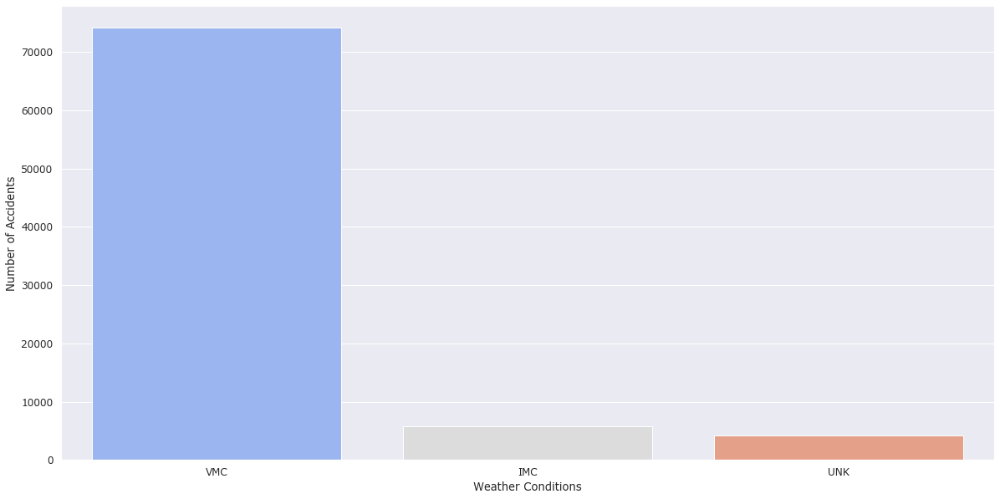

In [40]:
#Plotting accidents on countplot based on Weather Conditions

sb.set(style="darkgrid", font = "Verdana", font_scale = 1.1)
f,axes = plt.subplots(1,1,figsize = (20,10))
Phase_plot = sb.countplot(weather["Weather.Condition"], order = weather_counts.index, palette = "coolwarm")
Phase_plot.set(xlabel = "Weather Conditions", ylabel = "Number of Accidents")

# 2) PLOTTING INCIDENTS ON INTERACTIVE WORLD MAP

In [41]:
import plotly.graph_objs as go 
import plotly.offline as py

In [42]:
#Replace null values in data
aviation_data = aviation_data.replace(np.nan, "Unknown")

#Investigate  aircraft damage

aviation_data["Aircraft.Damage"].value_counts()

Substantial    60838
Destroyed      18046
Unknown         2709
Minor           2662
Name: Aircraft.Damage, dtype: int64

In [43]:
#Replace null values in data
aviation_data = aviation_data.replace(np.nan, "Unknown")

#Assigning variables for different damages to aircraft

minor_damage = aviation_data[aviation_data["Aircraft.Damage"] == "Minor"]
sub_damage = aviation_data[aviation_data["Aircraft.Damage"] == "Substantial"]
dest_damage = aviation_data[aviation_data["Aircraft.Damage"] == "Destroyed"]
unk_damage = aviation_data[aviation_data["Aircraft.Damage"] == "Unknown"]


In [44]:
#Create Figure object 
fig = go.Figure()

#Create function to take data , marker name  and color to plot Aircraft Damage on map
def plot_air_dmg(data , marker_name , color):
    fig.add_trace(go.Scattergeo(
        lon = data["Longitude"] , 
        lat = data["Latitude"] ,
        text = data["Aircraft.Damage"] , 
        mode = "markers" , 
        marker_color = color , 
        name = marker_name,
        opacity = 0.7
          ))

#Use function to plot Aircraft Damage of different categories 
plot_air_dmg(minor_damage ,"Minor Damage" , "green")
plot_air_dmg(sub_damage , "Substantial Damage" , "purple")
plot_air_dmg(dest_damage , "Destroyed" , "tomato")
plot_air_dmg(unk_damage , "Unknown" , "yellow")
    
#Display figure 
fig.show()

# 3) PREDICTING THE TOTAL NUMBER OF ACCIDENTS IN THE INPUT YEAR AND THEIR DISTRUBITION ON THE BASIS OF THE AIRCRAFT MAKE

In [45]:
#Clean 'Make' column to have no duplicates 
aviation_data['Make'] = aviation_data['Make'].str.title()
#Verify that there are no duplicates
aviation_data['Make'].value_counts()

Cessna                  26070
Piper                   14229
Beech                    5148
Bell                     2598
Boeing                   2349
                        ...  
Malkin Roy K                1
Keithley Thomas E           1
Quicksilver Mfg             1
Evarts Aviation Inc.        1
Germany Wetherell           1
Name: Make, Length: 7190, dtype: int64

In [46]:
#Ask user for input year
input_year = int(input("Please enter a year after 1988: "))
make_known = aviation_data[aviation_data['Make'].isnull() == False]
#Create dataframe with data of last 5 years 
df = pd.DataFrame()
i = input_year-5
for i in range(input_year - 5 , input_year):
  df = pd.concat([df, make_known[years == i]], axis=0)
  i += 1
df.head()


Please enter a year after 1988: 2000


,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date
45357,20001207X05048,Accident,MIA96FA051,31/12/1995,"EAST NAPLES, FL",United States,Unknown,Unknown,MKY,MARCO ISLAND,...,Executive/Corporate,Unknown,2,0,0,0,IMC,APPROACH,Probable Cause,8/1/1997
45358,20001207X05076,Accident,NYC96LA046,30/12/1995,"WILDWOOD, NJ",United States,Unknown,Unknown,WWD,WILDWOOD/CAPE MAY,...,Instructional,Unknown,0,0,0,1,VMC,TAKEOFF,Probable Cause,22/6/1996
45359,20001207X05060,Accident,MIA96LA052,30/12/1995,"EASTOVER, SC",United States,Unknown,Unknown,Unknown,Unknown,...,Personal,Unknown,0,0,1,0,VMC,CRUISE,Probable Cause,25/11/1996
45360,20001207X05039,Accident,LAX96LA090,30/12/1995,"HONOLULU, HI",United States,Unknown,Unknown,Unknown,Unknown,...,Unknown,MAHALO AIR,0,1,0,23,VMC,DESCENT,Probable Cause,6/6/1996
45361,20001207X05038,Accident,LAX96LA089,30/12/1995,"LUCERNE VALLEY, CA",United States,Unknown,Unknown,Unknown,Unknown,...,Unknown,Unknown,0,0,0,3,VMC,LANDING,Probable Cause,31/7/1996


In [47]:
 #Find probabiltiy distribution by make in the last 5 years 
df["Make"].value_counts(normalize = True)

Cessna        0.322412
Piper         0.168788
Beech         0.065349
Bell          0.032404
Boeing        0.028161
                ...   
Leone         0.000090
Stearman      0.000090
Matto         0.000090
Mahan         0.000090
Armbruster    0.000090
Name: Make, Length: 1160, dtype: float64

In [48]:
#Create a column with year values 
df["Year"] = pd.to_datetime(df["Event.Date"]).dt.year
df["Month-int"] = pd.to_datetime(df["Event.Date"]).dt.month
jan_to_jun = df[df["Month-int"] <= 6]
jul_to_dec = df[df["Month-int"] > 6]
input_range = list(np.arange(input_year-5 , input_year , 0.5))
#Find number of accidents per year by dividing the year into 6 month intervals
accidents_per_year = []
for i in range(input_year -5 , input_year):
  accidents_per_year.append(len(jan_to_jun[df["Year"] == i]))
  accidents_per_year.append(len(jul_to_dec[df["Year"] == i]))

print(input_range)
print(accidents_per_year)





[1995.0, 1995.5, 1996.0, 1996.5, 1997.0, 1997.5, 1998.0, 1998.5, 1999.0, 1999.5]
[1086, 1223, 1109, 1078, 1089, 1059, 1114, 1112, 1059, 1150]


C:\Users\prans\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\prans\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



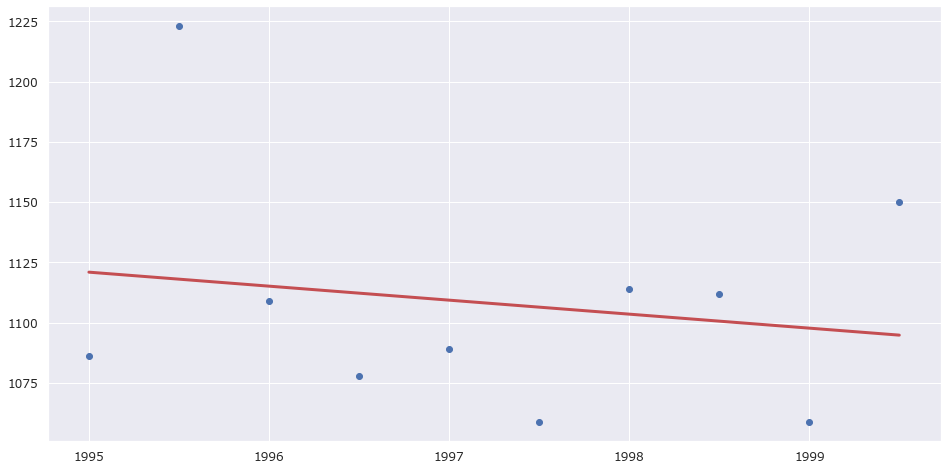

In [49]:
from sklearn.linear_model import LinearRegression

#Create linear regression model and use it to predict the total number of accidents 
linreg = LinearRegression()
input_range = np.array(input_range).reshape(-1,1)
input_year = np.array(input_year).reshape(-1,1)
linreg.fit(input_range , accidents_per_year)
predicted_accidents = float(linreg.predict(input_year)) + float(linreg.predict(input_year + 0.5))
# Formula for the Regression line
regline_x = input_range
regline_y = linreg.intercept_ + linreg.coef_ * input_range

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(input_range, accidents_per_year)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

In [50]:
#Create dataframe with model names and predicted number of accidents calculated 
#using the probability of the last 5 years
dt = pd.DataFrame(columns= ["Make" , "Predicted No. of Accidents"])
for make in df["Make"].unique():
  avg_proba =  len(df[df['Make']== make])/len(df)
  no_accidents = round(avg_proba * predicted_accidents)
  if no_accidents != 0 :
    dt = dt.append({"Make" : make , "Predicted No. of Accidents" : no_accidents},ignore_index = True)
dt = dt.sort_values("Predicted No. of Accidents",ascending = False).reset_index(drop = True)
print(dt)
print("Total Predicted Accidents : "  , round(predicted_accidents))

                    Make Predicted No. of Accidents
0                 Cessna                        703
1                  Piper                        368
2                  Beech                        143
3                   Bell                         71
4                 Boeing                         61
..                   ...                        ...
144              Russell                          1
145  Continental Copters                          1
146  Consolidated-Vultee                          1
147                Adams                          1
148        Chance Vought                          1

[149 rows x 2 columns]
Total Predicted Accidents :  2181


# 4) PREDICTION OF DIFFERENT OUTCOMES BASED ON INPUT PARAMETERS

In [51]:
aviation_data["Year"] = pd.DataFrame(years)
aviation_data["Month"] = pd.DataFrame(months)
aviation_data.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date,Year,Month
0,20200102X82407,Accident,WPR20CA055,31/12/2019,"Elk, CA",United States,39.1286,-123.716,LLR,Little River,...,Unknown,Unknown,Unknown,1,VMC,TAKEOFF,Factual,13/1/2020,2019,12
1,20191231X83852,Accident,CEN20FA049,31/12/2019,"OLATHE, KS",United States,38.8461,-94.7361,OJC,Johnson County Executive,...,2,Unknown,Unknown,Unknown,VMC,TAKEOFF,Preliminary,8/1/2020,2019,12
2,20200102X54844,Accident,ANC20CA011,31/12/2019,"Fairbanks, AK",United States,64.6669,-148.133,Unknown,Unknown,...,Unknown,Unknown,Unknown,2,Unknown,Unknown,Preliminary,2/1/2020,2019,12
3,20191230X91852,Accident,CEN20CA048,30/12/2019,"GRANBURY, TX",United States,32.3656,-97.645,Unknown,Unknown,...,Unknown,Unknown,Unknown,1,Unknown,Unknown,Preliminary,31/12/2019,2019,12
4,20191228X62945,Unknown,WPR20CA053,28/12/2019,"Missoula, MT",United States,Unknown,Unknown,MSO,Unknown,...,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Preliminary,3/1/2020,2019,12


In [52]:
#Map all the relevant data to numbers for easier prediction

#Create dictionaries to use to map the columns to for normalization

damage_dict = {"Destroyed":0 , "Substantial":1 , "Minor":2 , "Unknown" : 3}
weather_dict = {"VMC" : 0 , "IMC" : 1 , "UNK" : 2 , "Unknown" : 3}
phase_dict = ({"LANDING" : 0 , "TAKEOFF" : 1 , "CRUISE" : 2, "MANEUVERING" : 3 , 
                                                                    "APPROACH": 4 ,"TAXI" : 5 , "CLIMB" : 6 , 
                                                                    "DESCENT" : 7,"GO-AROUND" : 8 , "STANDING" : 9 ,
                                                                    "UNKNOWN" : 10 , "Unknown" : 10 , "OTHER" : 11 })
inj_sev_dict = {"Fatal" : 0 ,"Incident" : 1 , "Non-Fatal" : 2 , "Unavailable" : 3 , "Unknown" : 3 }
built_dict = {"No" : 0 , "Yes" : 1 , "Unknown" : 2}
air_cat_dict = {"Airplane" : 0 , "Helicopter" : 1}


#Find top 10 makes , their value counts and create dictionary to normalize data

top_makes = aviation_data['Make'].value_counts()[:10].index.tolist()
make_dict = {}
i = 0 
for make in top_makes:
  a = aviation_data.loc[aviation_data["Make"] == make, 'Make'].count()
  make_dict[make] = i
  i += 1
eng_type_dict = {"Reciprocating" : 0 , "Turbo Shaft" : 1 ,"Turbo Prop" : 2 , "Turbo Fan" : 3 , "Turbo Jet" : 4}


#Create normalized data dataframe with relevent factors

normalized_data = pd.DataFrame(aviation_data[["Country" , "Injury.Severity" , "Aircraft.Damage" , "Aircraft.Category" , 
                                              "Make" ,"Engine.Type" , "Weather.Condition" , "Broad.Phase.of.Flight" , 
                                              "Year" , "Month" , "Amateur.Built"]])

#Normalize data

normalized_data["Country"] = normalized_data["Country"].apply(lambda row: 0 if row =="United States" else 1)
normalized_data["Injury.Severity"] = normalized_data["Injury.Severity"].apply(lambda row : 
                                                                              "Fatal" if row.startswith("Fatal") 
                                                                              else row)
normalized_data["Injury.Severity"] = normalized_data["Injury.Severity"].map(inj_sev_dict)
normalized_data["Aircraft.Damage"] = normalized_data["Aircraft.Damage"].map(damage_dict)
normalized_data["Aircraft.Category"] = normalized_data["Aircraft.Category"].apply(lambda row : 
                                                                       air_cat_dict[row] if row in air_cat_dict else 2)
normalized_data["Make"] = normalized_data["Make"].apply(lambda row : make_dict[row] if row in make_dict else 10)
normalized_data["Engine.Type"] = normalized_data["Engine.Type"].apply(lambda row : 
                                                                       eng_type_dict[row] if row in eng_type_dict else 5)
normalized_data["Weather.Condition"] = normalized_data["Weather.Condition"].map(weather_dict)
normalized_data["Broad.Phase.of.Flight"] = normalized_data["Broad.Phase.of.Flight"].map(phase_dict)
normalized_data["Amateur.Built"] = normalized_data["Amateur.Built"].map(built_dict)
normalized_data.head()

,Country,Injury.Severity,Aircraft.Damage,Aircraft.Category,Make,Engine.Type,Weather.Condition,Broad.Phase.of.Flight,Year,Month,Amateur.Built
0,0,2,1,0,0,0,0,1,2019,12,0
1,0,0,0,0,5,0,0,1,2019,12,0
2,0,2,1,0,0,5,3,10,2019,12,0
3,0,2,1,0,10,5,3,10,2019,12,1
4,0,3,1,2,0,5,3,10,2019,12,0


In [53]:
#Verify that there are no null values 

print(normalized_data.isna().sum())

Country                  0
Injury.Severity          0
Aircraft.Damage          0
Aircraft.Category        0
Make                     0
Engine.Type              0
Weather.Condition        0
Broad.Phase.of.Flight    0
Year                     0
Month                    0
Amateur.Built            0
dtype: int64


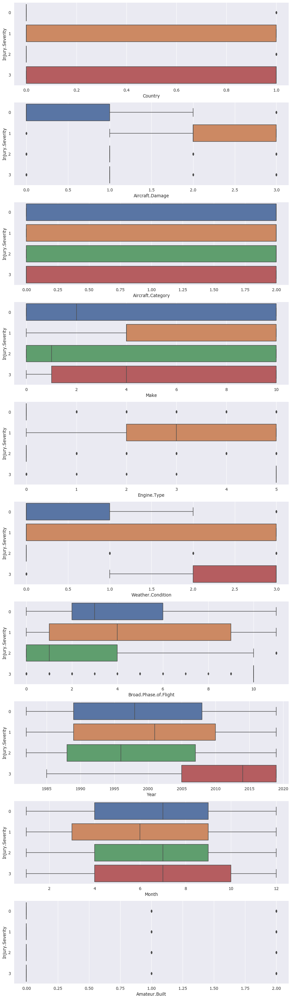

In [54]:
#Plot variables against Injury Severity to check which is a factor 

possible_factors = ["Country" , "Aircraft.Damage" , "Aircraft.Category" , "Make" ,"Engine.Type" , 
                                  "Weather.Condition" , "Broad.Phase.of.Flight" , "Year" , "Month", "Amateur.Built"]  
f,axes = plt.subplots(10,1 , figsize = (15,55))
for i , factor in enumerate(possible_factors):
  sb.boxplot(x = normalized_data[factor] , y = normalized_data["Injury.Severity"] , orient = "h" , ax = axes[i])

### Based on the above boxplots , we can see that the factors that are useful in predicting the Injury Severity are : Aircraft Damage , Make , Engine Type , Weather Condition , Phase of Flight , Country , Year and Month

In [55]:
#Create labels from normalized data of Injury Severity

labels = pd.DataFrame(normalized_data["Injury.Severity"])


#Define data to consist of normalized factors determining Injury Severity 

data = normalized_data[["Country" ,"Aircraft.Damage" , "Weather.Condition" , "Broad.Phase.of.Flight" ,"Make" , 
                        "Engine.Type", "Year" , "Month"]]
data = pd.DataFrame(data)


#Verify that there are no null values 

print(data.isna().sum())
print(labels.isna().sum())


Country                  0
Aircraft.Damage          0
Weather.Condition        0
Broad.Phase.of.Flight    0
Make                     0
Engine.Type              0
Year                     0
Month                    0
dtype: int64
Injury.Severity    0
dtype: int64


In [56]:
#Import modules for Random Forest 

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import svm
from sklearn.model_selection import cross_val_score


# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

#Split data and labels into train and test sets 

train_data , test_data , train_labels , test_labels = train_test_split( data , labels , test_size = 0.2)


#Create RandomForestClassifer and SupportVectorMachines

forest  = RandomForestClassifier()
svm1 = svm.SVC(decision_function_shape='ovr',kernel='rbf') 
svm2= svm.LinearSVC() 

models = [ forest, svm1, svm2] 
modelnames = [ "Random Forest " , "SVM with Exponential Kernel " , " Linear SVM "] 
scoreavg = [ 0,0,0] 

#Train the model and compare performances using K-Fold Cross Validation
for i in range(0,3) :
    scores = cross_val_score(models[i], train_data, train_labels.values.ravel(), cv=5)
    scoreavg[i]= (scores.mean()) 
    print("Accuracy of " + str(modelnames[i]) + "On Training Set = " + str((scores.mean()).round(3)))

# SVM with exponential kernal has best performance
# Fit SVM to train set
svm1.fit(train_data,train_labels.values.ravel())  
print("Accuracy of SVM with exponential Kernel "  + "On Test Set = " + str((svm1.score(test_data , test_labels)).round(3)))

Accuracy of Random Forest On Training Set = 0.85
Accuracy of SVM with Exponential Kernel On Training Set = 0.857


C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Accuracy of  Linear SVM On Training Set = 0.721
Accuracy of SVM with exponential Kernel On Test Set = 0.853


### Based on the above accuracies , we use the SVM with exponential Kernel to make our prediction

In [57]:
#Ask user for input 

input_country = (input("Enter a Country : ")).title()
input_damage = (input("Enter the aircraft damage : ")).title()
input_weather = (input("Enter Weather condition : ")).upper()
input_phase = (input("Enter Phase of Flight : ")).upper()
input_make = (input("Enter Make : ")).title
input_eng_type = (input("Enter Engine Type : ")).title()
input_year = input("Enter Year : ")
input_month = (input("Enter Month : ")).title()

#Normalize input 

if input_country == "United States":
  input_country = 0
else:
  input_country = 1

input_damage = damage_dict[input_damage]
input_weather = weather_dict[input_weather]
input_phase = phase_dict[input_phase]

if input_make in make_dict:
  input_make = make_dict[input_make]
else:
  input_make = 10

if input_eng_type in eng_type_dict:
  input_eng_type = eng_type_dict[input_eng_type]
else:
  input_eng_type  = 5

month_dict = {"January" : 1 , "February" : 2 , "March" : 3 , "April" : 4 , "May" : 5 , "June" : 6 , "July" : 7 ,
              "August" : 8 , "September" : 9 , "October" : 10 , "November" : 11 , "December" : 12}

input_month = month_dict[input_month]

#Predict injury severity based on input

prediction = svm1.predict(np.array([input_country , input_damage , input_weather , input_phase , input_make , 
                                      input_eng_type , input_year , input_month]).reshape(1,-1))
injury_dict = {0: "Fatal" ,1: "Incident" , 2:"Non-Fatal" ,3:"Unclear" }
print(injury_dict[int(prediction)])

Enter a Country : United States
Enter the aircraft damage : Destroyed
Enter Weather condition : IMC
Enter Phase of Flight : LANDING
Enter Make : Boeing
Enter Engine Type : Turbo Fan
Enter Year : 2019
Enter Month : February
Non-Fatal


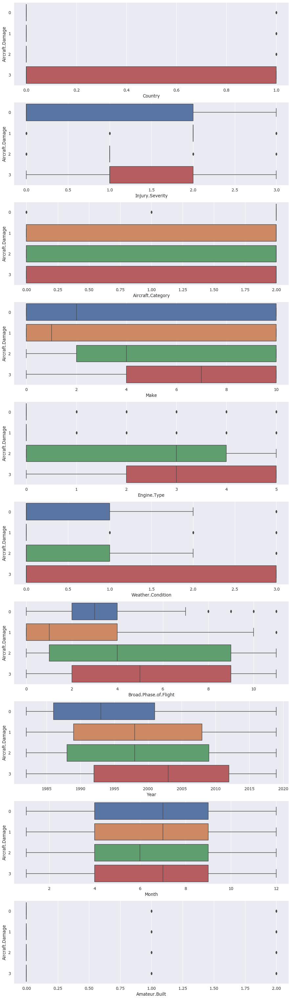

In [58]:
#Plot variables against Aircraft Damage to check which is a factor 

possible_factors_2 = ["Country" , "Injury.Severity" , "Aircraft.Category" , "Make" ,"Engine.Type" , 
                                  "Weather.Condition" , "Broad.Phase.of.Flight" , "Year" , "Month" , "Amateur.Built"]  
f,axes = plt.subplots(10,1 , figsize = (15,55))
for i , factor in enumerate(possible_factors_2):
  sb.boxplot(x = normalized_data[factor] , y = normalized_data["Aircraft.Damage"] , orient = "h" , ax = axes[i])

### Based on the above boxplots , we can see that the factors that are useful in predicting the Aircraft Damage  are : Injury Severity , Make , Engine Type , Weather Condition , Phase of Flight , Country , Year and Month

In [59]:
#Create labels from normalized data of Aircraft Damage

labels_2 = pd.DataFrame(normalized_data["Aircraft.Damage"])

#Define data to consist of normalized factors determining Injury Severity 

data_2 = normalized_data[["Country" , "Weather.Condition" , "Broad.Phase.of.Flight" ,"Make" , 
                          "Engine.Type","Year"]]
data_2 = pd.DataFrame(data_2)

#Verify that there are no null values 

print(data_2.isna().sum())
print(labels_2.isna().sum())


Country                  0
Weather.Condition        0
Broad.Phase.of.Flight    0
Make                     0
Engine.Type              0
Year                     0
dtype: int64
Aircraft.Damage    0
dtype: int64


In [60]:
#Split data and labels into train and test sets

train_data_2 , test_data_2 , train_labels_2 , test_labels_2 = train_test_split(data_2 , labels_2 , test_size = 0.2)

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

#Create RandomForestClassifer and SupportVectormachines 

forest_2 = RandomForestClassifier()
svm_1 = svm.SVC(decision_function_shape='ovr', kernel='rbf') 
svm_2= svm.LinearSVC() 

models_2 = [ forest_2, svm_1, svm_2] 
modelnames_2 = [ "Random Forest " , "SVM with Exponential Kernel " , " Linear SVM "] 
scoreavg_2 = [ 0,0,0] 

#Train the model and compare performances using K-Fold Cross Validation
for i in range(0,3) :
    scores = cross_val_score(models_2[i], train_data_2, train_labels_2.values.ravel(), cv=5)
    scoreavg_2[i]= (scores.mean()) 
    print("Accuracy of " + str(modelnames_2[i]) + "On Training Set = " + str((scores.mean()).round(3)))

# SVM with exponential kernal has best performance
# Fit SVM to train set
svm_1.fit(train_data_2,train_labels_2.values.ravel()) 
print("Accuracy of SVM with exponential Kernel"  + " On Test Set = " + str((svm_1.score(test_data_2 , test_labels_2)).round(3)))

Accuracy of Random Forest On Training Set = 0.736
Accuracy of SVM with Exponential Kernel On Training Set = 0.753


C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\prans\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Accuracy of  Linear SVM On Training Set = 0.714
Accuracy of SVM with exponential Kernel On Test Set = 0.753


### Based on the above accuracies , we use the SVM with exponential Kernel to make our prediction

In [61]:
#Ask user for input 

input_country_2 = (input("Enter a Country : ")).title()
input_weather_2 = (input("Enter Weather condition : ")).upper()
input_phase_2 = (input("Enter Phase of Flight : ")).upper()
input_make_2 = (input("Enter Make : ")).title()
input_eng_type_2 = (input("Enter Engine Type : ")).title()
input_year_2 = input("Enter Year : ")


#Normalize input 

if input_country_2 == "United States":
  input_country_2 = 0
else:
  input_country_2 = 1

input_weather_2 = weather_dict[input_weather_2]
input_phase_2 = phase_dict[input_phase_2]


if input_make_2 in make_dict:
  input_make_2 = make_dict[input_make_2]
else:
  input_make_2 = 10


if input_eng_type_2 in eng_type_dict:
  input_eng_type_2 = eng_type_dict[input_eng_type_2]
else:
  input_eng_type_2  = 5


#Predict aircraft damage based on input

prediction_2 = svm_1.predict(np.array([input_country_2 ,input_weather_2 , input_phase_2 , 
                                          input_make_2 ,input_eng_type_2, input_year_2]).reshape(1,-1))
damage_output_dict = {0: "Destroyed" , 1:"Substantial" , 2:"Minor" , 3:"Unknown"}
print(damage_output_dict[int(prediction_2)])

Enter a Country : United States
Enter Weather condition : VMC
Enter Phase of Flight : LANDING
Enter Make : Cessna
Enter Engine Type : Reciprocating
Enter Year : 2000
Substantial
